In [2]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import hypll
from hypll.manifolds.poincare_ball import Curvature, PoincareBall
from hypll.optim import RiemannianAdam
import hypll.nn as hnn
from hypll.tensors import TangentTensor
from matplotlib.animation import FuncAnimation
import argparse
from pyramid import create_pyramid
from continuous_maze import bfs, gen_traj, plot_traj, ContinuousGridEnvironment, TrajectoryDataset, LabelDataset
from hyperbolic_networks import HyperbolicMLP, hyperbolic_infoNCE_loss, manifold_map
from networks import StateActionEncoder, StateEncoder, infoNCE_loss
from train import get_maze
import os

<All keys matched successfully>

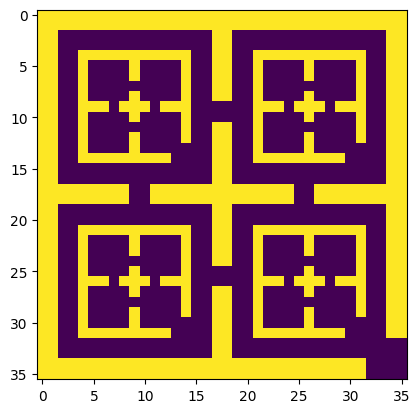

In [4]:
hyperbolic = True
maze_type = 'nested_pyramid'
maze = get_maze(maze_type)

e1_path = f'models/experiment1_hyperbolic_True_epochs_512_trajectories_100000_order__maze_nested_pyramid_embeddingdim_2_gamma_0.1_batch_1024_hyp_layers_2_encoder1_epoch_289.pth'
e2_path = f'models/experiment1_hyperbolic_True_epochs_512_trajectories_100000_order__maze_nested_pyramid_embeddingdim_2_gamma_0.1_batch_1024_hyp_layers_2_encoder2_epoch_289.pth'

# e1_path = f'models/experiment1_hyperbolic_True_epochs_256_trajectories_10000_maze_island_embeddingdim_2_gamma_0.1_batch_64_hyp_layers_2_best_encoder1_epoch_97.pth'
# e2_path = f'models/experiment1_hyperbolic_True_epochs_256_trajectories_10000_maze_island_embeddingdim_2_gamma_0.1_batch_64_hyp_layers_2_best_encoder2_epoch_97.pth'

device = "cuda" if torch.cuda.is_available() else "cpu"

manifold = PoincareBall(c=Curvature(value=0.1, requires_grad=True))

if hyperbolic:
    hyp_layers = 2
    euc_layers = 4 - hyp_layers
    hyp_widths = [64 for _ in range(hyp_layers)]
    hyp_widths.append(2)
    euc_widths = [64 for _ in range(euc_layers)]

    encoder1 = HyperbolicMLP(in_features=4, euc_widths=euc_widths, hyp_widths=hyp_widths, manifold=manifold).to(device)
    encoder2 = HyperbolicMLP(in_features=2, euc_widths=euc_widths, hyp_widths=hyp_widths, manifold=manifold).to(device)

    optimizer = RiemannianAdam(list(encoder1.parameters()) + list(encoder2.parameters()), lr=0.001)
else:
    encoder1 = StateActionEncoder(2).to(device)
    encoder2 = StateEncoder(2).to(device)
    optimizer = optim.Adam(list(encoder1.parameters()) + list(encoder2.parameters()), lr=0.001)

encoder1.load_state_dict(torch.load(e1_path, map_location=torch.device(device)))
encoder2.load_state_dict(torch.load(e2_path, map_location=torch.device(device)))

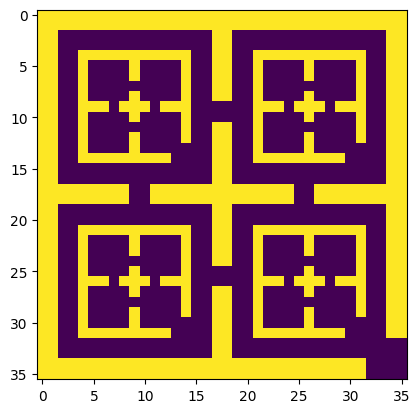

In [5]:
plt.imshow(maze)

In [6]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.collections import LineCollection

def plot_combined(maze, path, path_latents):
    path_latents_np = path_latents.cpu().detach().numpy()
    
    # Create a custom colormap for a smooth gradient
    colors = ['#4B0082', '#0000FF', '#00FFFF', '#00FF00', '#FFFF00', '#FF7F00', '#FF0000']
    cmap = LinearSegmentedColormap.from_list('custom', colors, N=256)
    
    # Create the plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    fig.patch.set_facecolor('#F0F0F0')  # Light gray background for the figure
    
    # Plot the maze trajectory (left subplot)
    ax1.imshow(maze, cmap=plt.cm.binary)
    if path:
        path_x, path_y = zip(*path)
        t = np.linspace(0, 1, len(path_x))
        
        # Plot the path with gradient color
        points = np.array([path_y, path_x]).T.reshape(-1, 1, 2) - 0.5
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        lc = LineCollection(segments, cmap=cmap, norm=plt.Normalize(0, 1))
        lc.set_array(t)
        ax1.add_collection(lc)
        
        # Plot points with the same color gradient
        scatter = ax1.scatter(np.array(path_y) - 0.5, np.array(path_x) - 0.5, c=t, cmap=cmap, s=50, zorder=3)
        
    # Mark the start and end points
#     ax1.plot(path_y[0] - 0.5, path_x[0] - 0.5, marker='o', color='g', markersize=10)
#     ax1.plot(path_y[-1] - 0.5, path_x[-1] - 0.5, marker='o', color='b', markersize=10)
    ax1.set_xticks(np.arange(-0.5, maze.shape[1], 1))
    ax1.set_yticks(np.arange(-0.5, maze.shape[0], 1))
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.grid(which='both', color='black', linestyle='-', linewidth=1)
    ax1.set_title('Maze with Shortest Path Highlighted', fontsize=16, fontweight='bold')
    
    # Plot the path latents (right subplot)
    circle = plt.Circle((0, 0), 1, fill=False, color='#1A1A1A', linestyle='--', linewidth=2, label='Unit Circle')
    ax2.add_artist(circle)
    
    t = np.linspace(0, 1, len(path_latents_np))
    points = ax2.scatter(path_latents_np[:, 0], path_latents_np[:, 1], c=t, cmap=cmap, 
                         s=50, zorder=3, label='Path Points')
    
    points = path_latents_np.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    lc = LineCollection(segments, cmap=cmap, norm=plt.Normalize(0, 1), linewidth=2, zorder=2)
    lc.set_array(t)
    line = ax2.add_collection(lc)
    
    ax2.set_aspect('equal', 'box')
    ax2.set_xlim(-1.1, 1.1)
    ax2.set_ylim(-1.1, 1.1)
    ax2.set_xlabel('Dimension 1', fontsize=12)
    ax2.set_ylabel('Dimension 2', fontsize=12)
    ax2.set_title('Path Latents with Unit Circle', fontsize=16, fontweight='bold')
    
    # Add colorbar
    cbar = plt.colorbar(line, ax=ax2)
    cbar.set_label('Path Progression', fontsize=12)
    
    ax2.legend(fontsize=10)
    ax2.grid(True, linestyle=':', alpha=0.7)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.show()

In [7]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.collections import LineCollection

def plot_multi(maze, paths, path_latents, labels):
    # Create the plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    fig.patch.set_facecolor('#F0F0F0')  # Light gray background for the figure
    
    # Plot the maze trajectory (left subplot)
    ax1.imshow(maze, cmap=plt.cm.binary)
    
    # Create a colormap for the labels
    unique_labels = np.unique(labels)
    colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))
    color_map = dict(zip(unique_labels, colors))
    
    for path, path_latent, label in zip(paths, path_latents, labels):
        path_latent_np = path_latent.cpu().detach().numpy()
        path_x, path_y = zip(*path)
        color = color_map[label]
        
        # Plot the path on the maze
        ax1.plot(np.array(path_y) - 0.5, np.array(path_x) - 0.5, color=color, linewidth=2, alpha=0.7)
        ax1.scatter(np.array(path_y) - 0.5, np.array(path_x) - 0.5, color=color, s=30, zorder=3, label=f'Path {label}')
        
        # Plot the path latents
        ax2.plot(path_latent_np[:, 0], path_latent_np[:, 1], color=color, linewidth=2, alpha=0.7)
        ax2.scatter(path_latent_np[:, 0], path_latent_np[:, 1], color=color, s=30, zorder=3, label=f'Path {label}')
    
    ax1.set_xticks(np.arange(-0.5, maze.shape[1], 1))
    ax1.set_yticks(np.arange(-0.5, maze.shape[0], 1))
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.grid(which='both', color='black', linestyle='-', linewidth=1)
    ax1.set_title('Maze with Multiple Paths', fontsize=16, fontweight='bold')
    ax1.legend(fontsize=10, loc='center left', bbox_to_anchor=(1, 0.5))
    
    # Plot the unit circle
    circle = plt.Circle((0, 0), 1, fill=False, color='#1A1A1A', linestyle='--', linewidth=2, label='Unit Circle')
    ax2.add_artist(circle)
    
    ax2.set_aspect('equal', 'box')
    ax2.set_xlim(-1.1, 1.1)
    ax2.set_ylim(-1.1, 1.1)
    ax2.set_xlabel('Dimension 1', fontsize=12)
    ax2.set_ylabel('Dimension 2', fontsize=12)
    ax2.set_title('Path Latents with Unit Circle', fontsize=16, fontweight='bold')
    
    ax2.legend(fontsize=10, loc='center left', bbox_to_anchor=(1, 0.5))
    ax2.grid(True, linestyle=':', alpha=0.7)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.show()

# Example usage:
# paths = [path1, path2, path3]
# path_latents = [path_latents1, path_latents2, path_latents3]
# labels = [1, 2, 3]
# plot_combined(maze, paths, path_latents, labels)

torch.Size([70, 2])


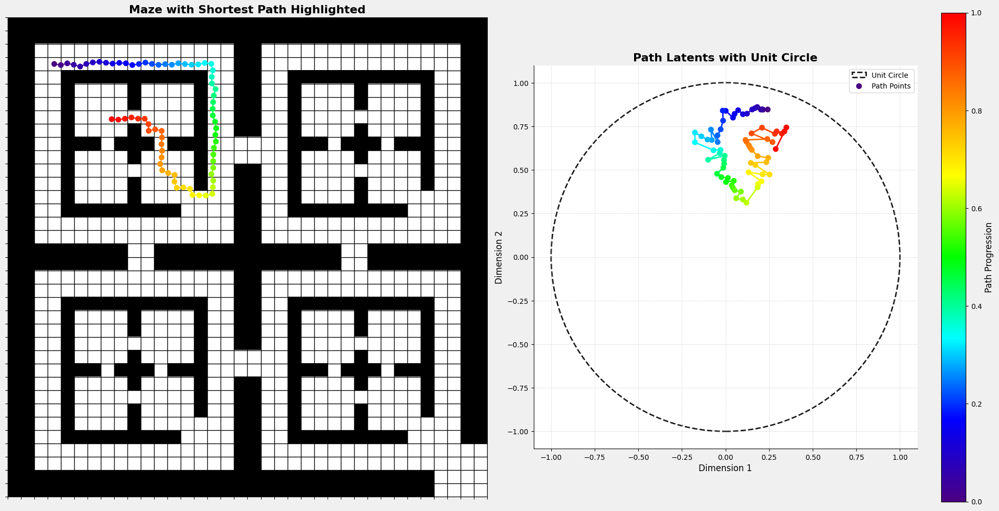

In [9]:
path = gen_traj(maze, (3, 3), (7, 7))
# print(path)
# plot_traj(maze, [x[0] for x in path])

action_paths = torch.stack([torch.tensor(np.concatenate(x)) for x in path]).to(device, torch.float32)
# print(action_paths)
path_latents = encoder1(action_paths).tensor
print(path_latents.shape)
# plot_path_latents(path_latents)
plot_combined(maze, [x[0] for x in path], path_latents)

torch.Size([65, 2])


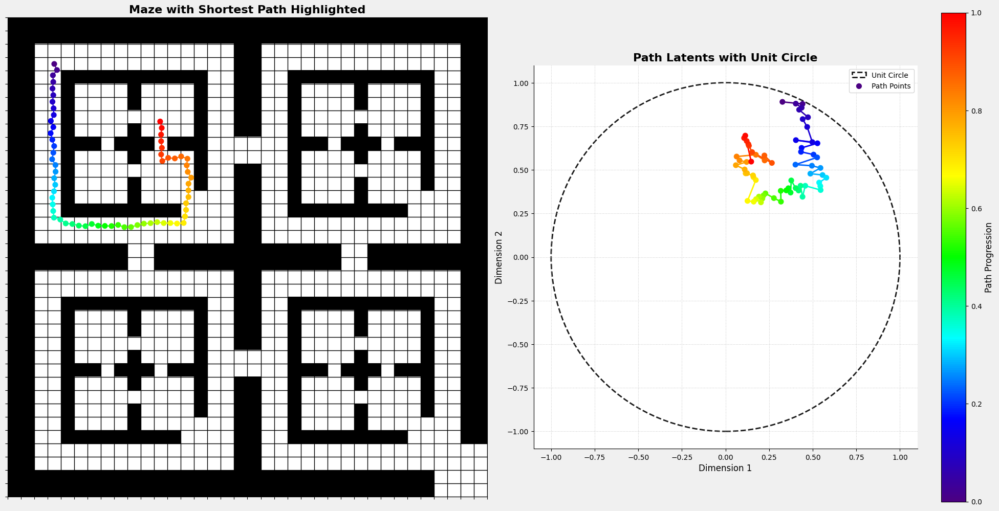

In [13]:
path = gen_traj(maze, (3, 3), (7, 11))
# print(path)
# plot_traj(maze, [x[0] for x in path])

action_paths = torch.stack([torch.tensor(np.concatenate(x)) for x in path]).to(device, torch.float32)
# print(action_paths)
path_latents = encoder1(action_paths).tensor
print(path_latents.shape)
# plot_path_latents(path_latents)
plot_combined(maze, [x[0] for x in path], path_latents)

torch.Size([36, 2])


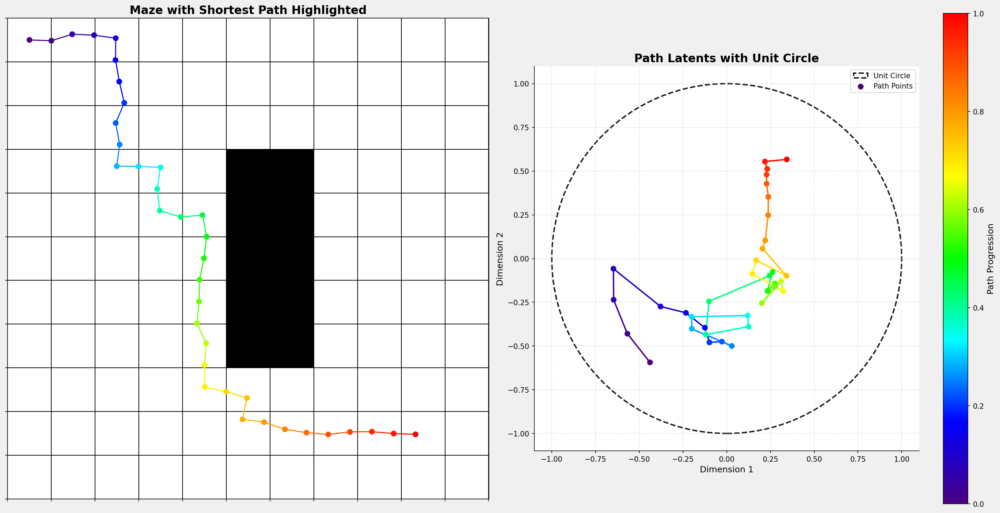

In [31]:
path = gen_traj(maze, (0, 0), (9, 9))
# print(path)
# plot_traj(maze, [x[0] for x in path])

action_paths = torch.stack([torch.tensor(np.concatenate(x)) for x in path]).to(device, torch.float32)
# print(action_paths)
path_latents = encoder1(action_paths).tensor
print(path_latents.shape)
# plot_path_latents(path_latents)
plot_combined(maze, [x[0] for x in path], path_latents)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


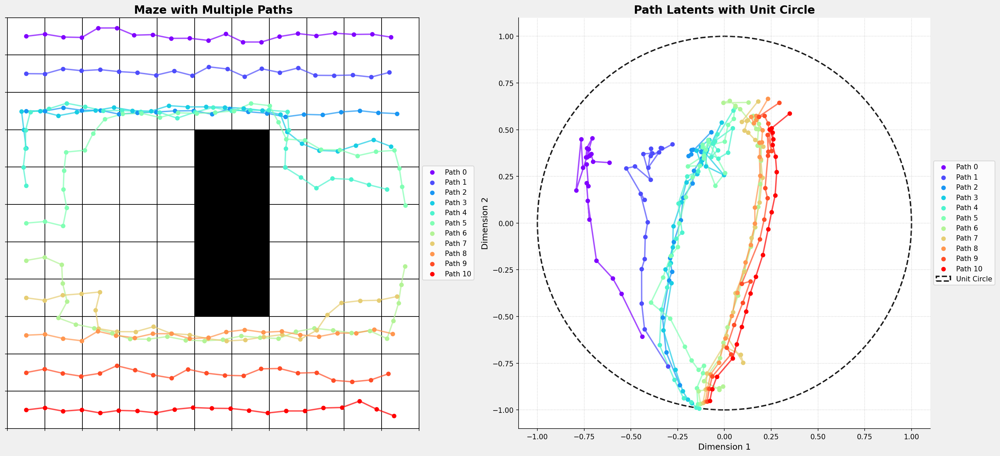

In [32]:
n = 11

paths = [gen_traj(maze, (i, 0), (i, 10)) for i in range(n)]
action_paths = [torch.stack([torch.tensor(np.concatenate(x)) for x in path]).to(device, torch.float32) for path in paths]

path_latents = [encoder1(ap).tensor for ap in action_paths]

grid_paths = [[y[0] for y in x] for x in paths]
path_latents
labels = [i for i in range(n)]
print(labels)
plot_multi(maze, grid_paths, path_latents, labels)


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


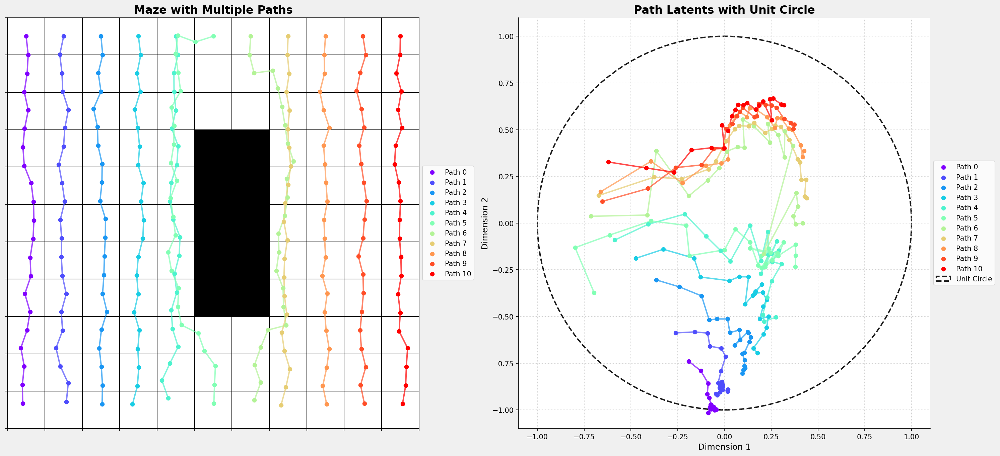

In [33]:
n = 11

paths = [gen_traj(maze, (0, i), (10, i)) for i in range(n)]
action_paths = [torch.stack([torch.tensor(np.concatenate(x)) for x in path]).to(device, torch.float32) for path in paths]

path_latents = [encoder1(ap).tensor for ap in action_paths]

grid_paths = [[y[0] for y in x] for x in paths]
path_latents
labels = [i for i in range(n)]
print(labels)
plot_multi(maze, grid_paths, path_latents, labels)


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


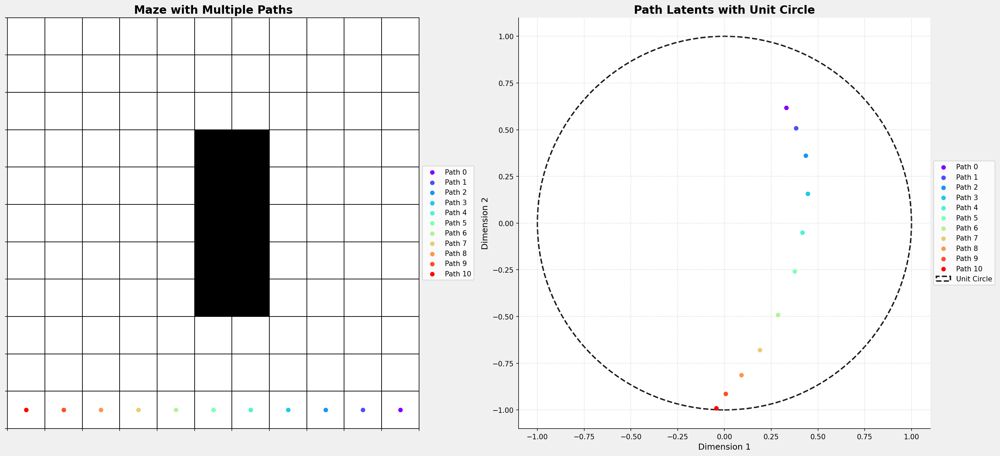

In [34]:
n = 11

paths = [gen_traj(maze, (10, i), (10, i)) for i in reversed(range(n))]
action_paths = [torch.stack([torch.tensor(np.concatenate(x)) for x in path]).to(device, torch.float32) for path in paths]

path_latents = [encoder1(ap).tensor for ap in action_paths]

grid_paths = [[y[0] for y in x] for x in paths]
path_latents
labels = [i for i in range(n)]
print(labels)
plot_multi(maze, grid_paths, path_latents, labels)


In [35]:
valid_indices = np.argwhere(maze == 0)
valid_indices = valid_indices + 0.5

valid_indices

array([[ 0.5,  0.5],
       [ 0.5,  1.5],
       [ 0.5,  2.5],
       [ 0.5,  3.5],
       [ 0.5,  4.5],
       [ 0.5,  5.5],
       [ 0.5,  6.5],
       [ 0.5,  7.5],
       [ 0.5,  8.5],
       [ 0.5,  9.5],
       [ 0.5, 10.5],
       [ 1.5,  0.5],
       [ 1.5,  1.5],
       [ 1.5,  2.5],
       [ 1.5,  3.5],
       [ 1.5,  4.5],
       [ 1.5,  5.5],
       [ 1.5,  6.5],
       [ 1.5,  7.5],
       [ 1.5,  8.5],
       [ 1.5,  9.5],
       [ 1.5, 10.5],
       [ 2.5,  0.5],
       [ 2.5,  1.5],
       [ 2.5,  2.5],
       [ 2.5,  3.5],
       [ 2.5,  4.5],
       [ 2.5,  5.5],
       [ 2.5,  6.5],
       [ 2.5,  7.5],
       [ 2.5,  8.5],
       [ 2.5,  9.5],
       [ 2.5, 10.5],
       [ 3.5,  0.5],
       [ 3.5,  1.5],
       [ 3.5,  2.5],
       [ 3.5,  3.5],
       [ 3.5,  4.5],
       [ 3.5,  7.5],
       [ 3.5,  8.5],
       [ 3.5,  9.5],
       [ 3.5, 10.5],
       [ 4.5,  0.5],
       [ 4.5,  1.5],
       [ 4.5,  2.5],
       [ 4.5,  3.5],
       [ 4.5,  4.5],
       [ 4.5,

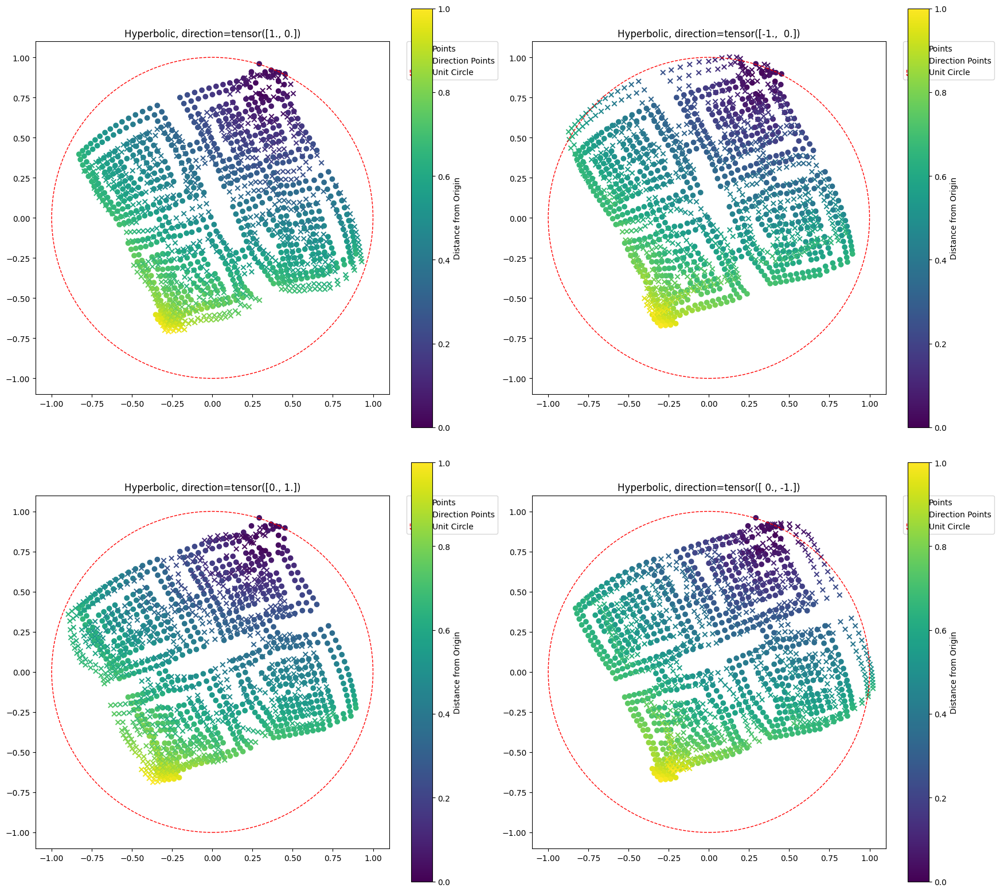

In [14]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.patches as patches
from sklearn.manifold import TSNE

def plot(ax, maze, direction, encoder1, encoder2, manifold, hyperbolic, device):
    with torch.no_grad():
        points = []
        valid_indices = np.argwhere(maze == 0)
        valid_indices = valid_indices + 0.5
        grid = valid_indices
        
        for p in grid:
            v = torch.tensor(p).to(device, torch.float32)
            v = encoder2(v)
            if hyperbolic:
                v = manifold.project(v)
                v = v.tensor
            points.append(v.cpu().detach().numpy())
        dir_points = []
        for p in grid:
            v = torch.stack([torch.tensor(p), direction]).flatten().to(device, torch.float32)
            v = encoder1(v)
            if hyperbolic:
                v = manifold.project(v)
                v = v.tensor
            dir_points.append(v.cpu().detach().numpy())
    
    points = np.array(points)
    dir_points = np.array(dir_points)
    
    # Compute distances from origin
    distances_points = torch.norm(torch.tensor(grid) - torch.tensor([5., 5.]), dim=1).numpy()
    distances_dir_points = torch.norm(torch.tensor(grid) - torch.tensor([5., 5.]), dim=1).numpy()
    
    # Normalize distances for colormap
    norm_distances_points = (distances_points - distances_points.min()) / (distances_points.max() - distances_points.min())
    norm_distances_dir_points = (distances_dir_points - distances_dir_points.min()) / (distances_dir_points.max() - distances_dir_points.min())
    
    # Use a colormap
    cmap = cm.viridis
    
    # Create scatter plots with colors based on distance
    scatter1 = ax.scatter(x=points[:,0], y=points[:,1], c=norm_distances_points, cmap=cmap, label='Points')
    scatter2 = ax.scatter(x=dir_points[:,0], y=dir_points[:,1], c=norm_distances_dir_points, cmap=cmap, marker='x', label='Direction Points')
    
    # Add color bar for the first scatter plot
    if ax.get_legend() is None:
        plt.colorbar(scatter1, ax=ax, label='Distance from Origin')
    
    # Plot the unit circle
    circle = plt.Circle((0, 0), 1, fill=False, color='r', linestyle='--', label='Unit Circle')
    ax.add_artist(circle)
    
    if hyperbolic:
        ax.set_title(f'Hyperbolic, direction={direction}')
    else:
        ax.set_title(f'Euclidean, direction={direction}')
    
    # Move legend outside the plot
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    
    # Set equal aspect ratio and fixed limits
    ax.set_aspect('equal', 'box')
    ax.set_xlim(-1.1, 1.1)
    ax.set_ylim(-1.1, 1.1)

# Create a figure and a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 16))  # Increased figure size
# Example usage
directions = [torch.tensor([1., 0.]), torch.tensor([-1., 0.]), torch.tensor([0., 1.]), torch.tensor([0., -1.])]
ax_flat = axs.flatten()  # Flatten the 2x2 array of axes for easy iteration
for i, direction in enumerate(directions):
    plot(ax_flat[i], maze, direction, encoder1, encoder2, manifold, hyperbolic, device)

# Adjust layout to prevent overlap
plt.tight_layout()
# Add extra space on the right for the legends
plt.subplots_adjust(right=0.85)
plt.show()

In [37]:
def visualize_path(start, end, encoder_mod1, encoder_mod2, hyperbolic=False, manifold=None, max_steps=100, eps=50):
    with torch.no_grad():
        # maze.cpu()
        vec2 = None
        start = torch.tensor(start).to(device, torch.float32)
        goal = torch.tensor(end).to(device, torch.float32)
        
        vec2 = encoder_mod2(goal)

        env = ContinuousGridEnvironment(maze, start.cpu(), {})
        fig, ax = plt.subplots()

        def update(i):
            with torch.no_grad():
                cur_pos = env.agent_position

                activations = []
                angles = torch.linspace(0., 2 * torch.pi, 16)
                for a in angles:
                    action = torch.tensor([torch.sin(a), torch.cos(a)])
                    vec1 = torch.tensor([cur_pos[0], cur_pos[1], torch.sin(a), torch.cos(a)]).to(device, torch.float32)
                    vec1 = encoder_mod1(vec1)

                    # MANIFOLD EVAL
                    if hyperbolic:
                        activations.append((action, -manifold.dist(x=vec1, y=vec2)))
                    else:
                        activations.append((action, -torch.norm(vec1 - vec2)))

                best_action = activations[np.argmax([x[1].cpu() for x in activations])][0]
                angle = np.arctan2(best_action[0], best_action[1]) + np.random.normal() * eps * (2 * np.pi / 360)
                best_action = torch.tensor(np.array([np.sin(angle), np.cos(angle)]))
                env.move_agent(best_action)
                # print(f'agent position: {env.agent_position}')
                ax.clear()
                env.display(ax=ax)

        # Set animation display in Jupyter notebook and figure resolution
        plt.rcParams["animation.html"] = "jshtml"
        plt.rcParams['figure.dpi'] = 150

        # Create the animation
        ani = FuncAnimation(fig, update, frames=max_steps, interval=max_steps, repeat=False)

    return ani

/tmp/ipykernel_3972790/3839252379.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  start = torch.tensor(start).to(device, torch.float32)
/tmp/ipykernel_3972790/3839252379.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  goal = torch.tensor(end).to(device, torch.float32)


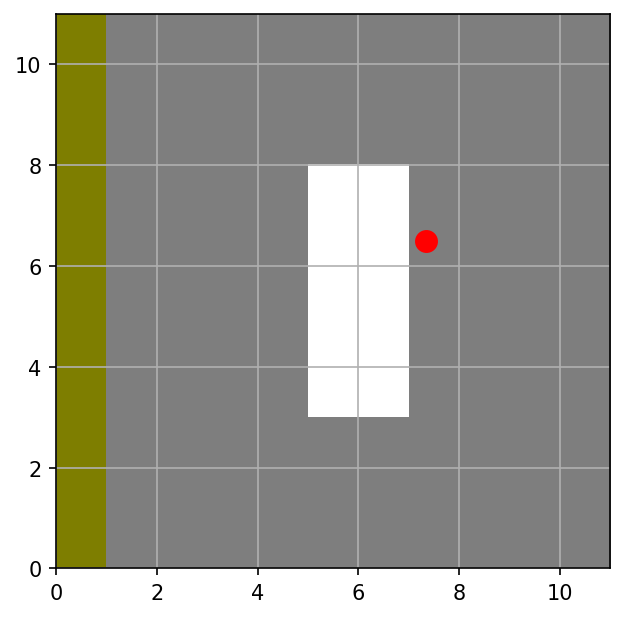

In [38]:
start = torch.tensor([5., 0.])
end = torch.tensor([5., 9.])


visualize_path(start, end, encoder1, encoder2, hyperbolic=hyperbolic, manifold=manifold)

/tmp/ipykernel_1809254/3839252379.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  start = torch.tensor(start).to(device, torch.float32)
/tmp/ipykernel_1809254/3839252379.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  goal = torch.tensor(end).to(device, torch.float32)


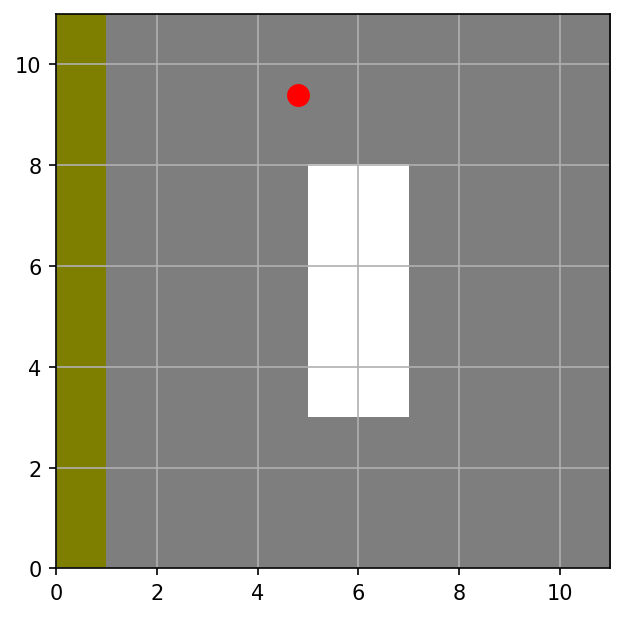

In [62]:
start = torch.tensor([6., 0.])
end = torch.tensor([6., 9.])


visualize_path(start, end, encoder1, encoder2, hyperbolic=hyperbolic, manifold=manifold)

/tmp/ipykernel_2183243/3839252379.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  start = torch.tensor(start).to(device, torch.float32)
/tmp/ipykernel_2183243/3839252379.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  goal = torch.tensor(end).to(device, torch.float32)


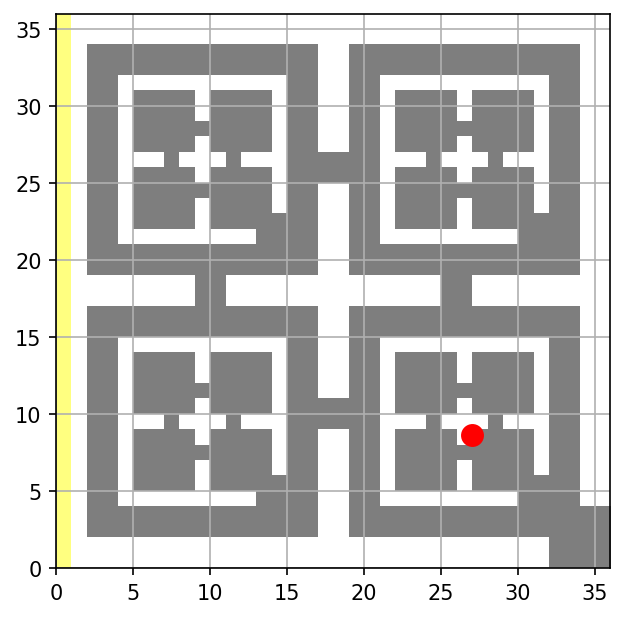

In [50]:
start = torch.tensor([7.5, 7.5])
end = torch.tensor([23.5, 23.5])


visualize_path(start, end, encoder1, encoder2, hyperbolic=hyperbolic, manifold=manifold, max_steps=500)

In [46]:
from train import evaluate

results = evaluate(maze, 100, encoder1, encoder2, manifold, max_steps=500, eps=50.)

In [51]:
np.mean([x[0] for x in results])

0.32

In [54]:
dataset = TrajectoryDataset(maze, 1000, embedding_dim=8, num_negatives=10, gamma=0.01)

gamma: 0.01


(array([ 58.,  75., 127., 131., 171., 186., 135.,  83.,  25.,   9.]),
 array([  1. ,  14.9,  28.8,  42.7,  56.6,  70.5,  84.4,  98.3, 112.2,
        126.1, 140. ]),
 <BarContainer object of 10 artists>)

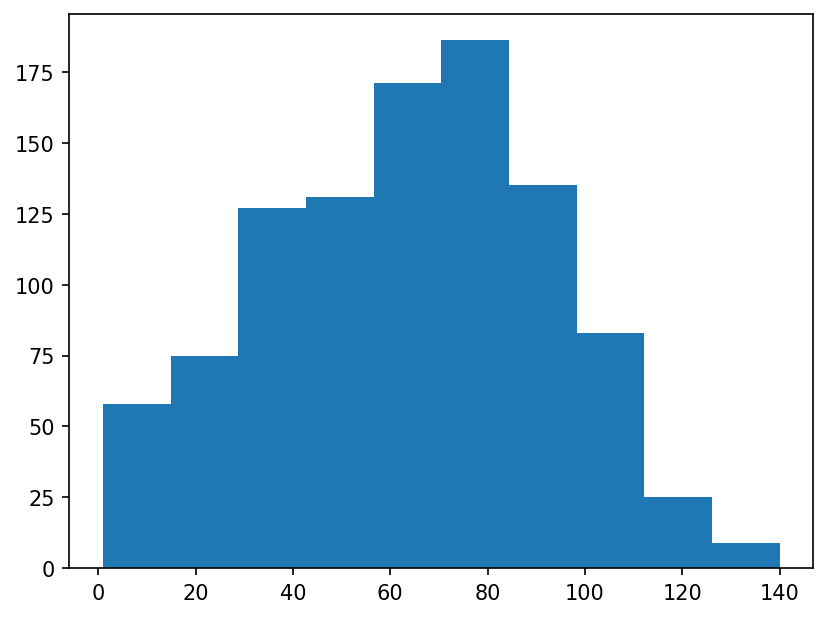

In [55]:
trajectories = dataset.trajectories

lengths = []
for traj in trajectories:
    lengths.append(len(traj))

plt.hist(lengths)

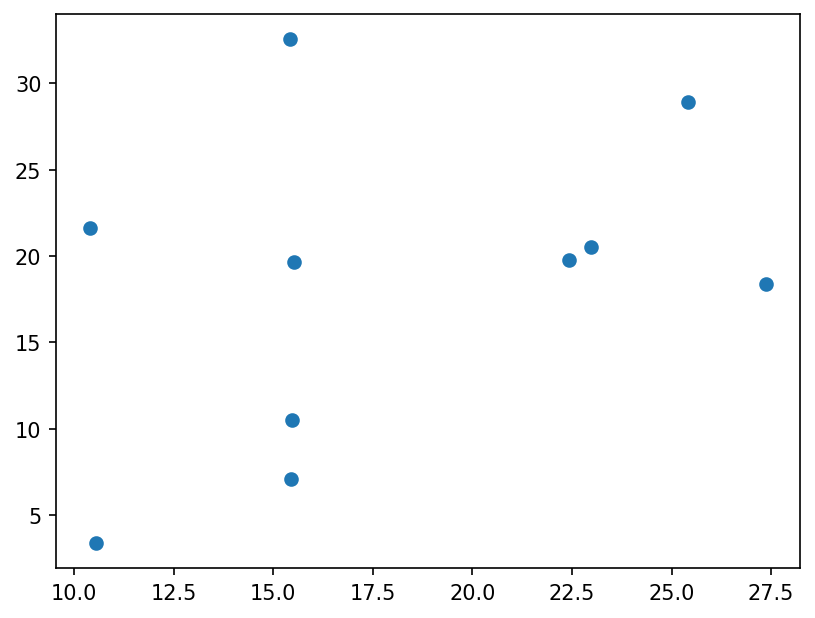

In [33]:
plt.scatter(dataset[1][2][:,0], dataset[1][2][:,1])